In [117]:
from imgtools.io import read_dicom_auto
from imgtools.ops.functional import (
    bounding_box,
    centroid,
    clip_intensity,
    crop,
    crop_to_mask_bounding_box,
    image_statistics,
    min_max_scale,
    resample,
    resize,
    rotate,
    standard_scale,
    window_intensity,
    zoom,
)

In [120]:
image_path = '/home/joshua-siraj/Documents/BHKLAB/imgtools_test/RADCURE/RADCURE-0005/02-12-2002-NA-Research HNC Planning CT-48575/2.000000-Helical Axial-40982'
example_scan = read_dicom_auto(image_path)
example_image = example_scan.image

# Helpers

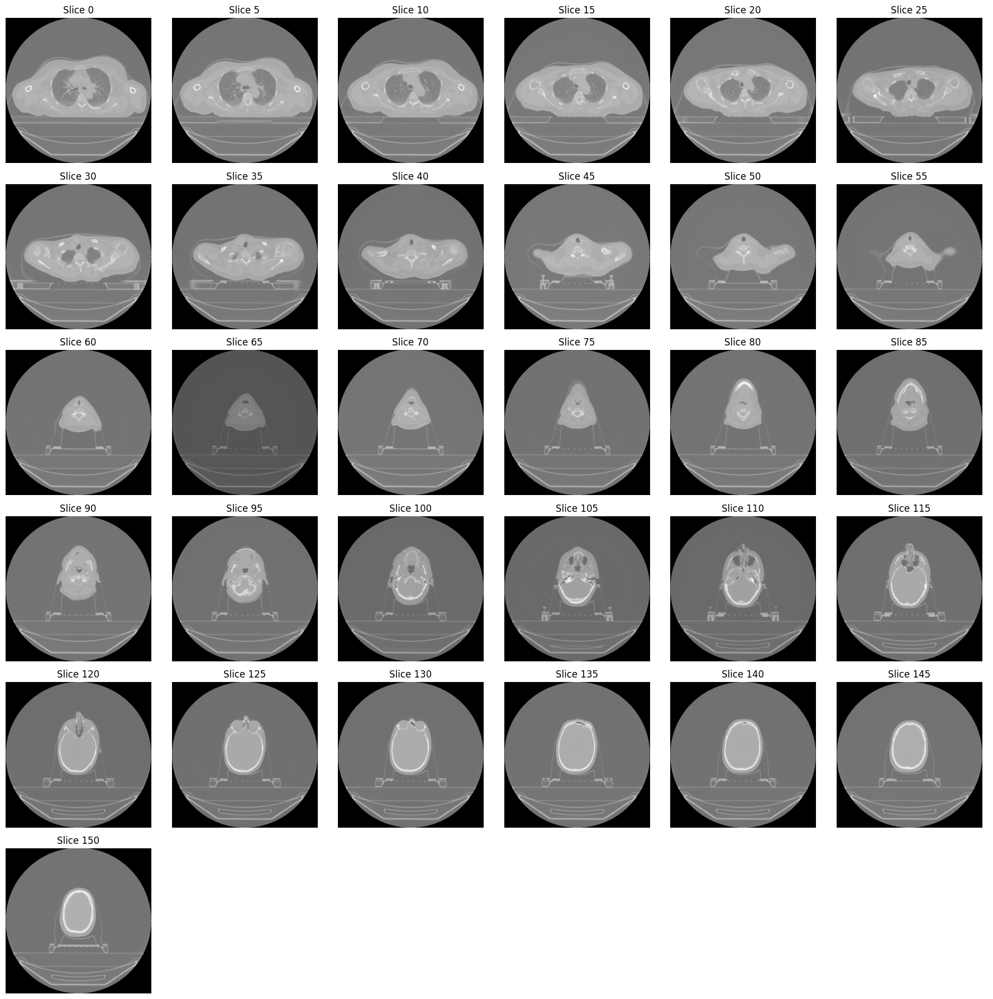

In [121]:
import math

import matplotlib.pyplot as plt
import SimpleITK as sitk


def visualize_3d_slices_adaptive(image: sitk.Image, axis: int = 0, step: int = 1, cmap='gray'):
    """
    Visualizes every n-th slice of a 3D SimpleITK image along a specified axis in an adaptive grid layout.

    Args:
        image (sitk.Image): The 3D SimpleITK image to visualize.
        axis (int): The axis along which to slice (0: x, 1: y, 2: z).
        step (int): The step size for selecting slices. Defaults to 1 (every slice).
    """
    array = sitk.GetArrayFromImage(image)
    num_slices = array.shape[axis]
    selected_slices = range(0, num_slices, step)
    num_selected_slices = len(selected_slices)

    # Calculate adaptive grid size
    cols = math.ceil(math.sqrt(num_selected_slices))
    rows = math.ceil(num_selected_slices / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.ravel()  # Flatten the axes for easy iteration

    for i, slice_index in enumerate(selected_slices):
        if axis == 0:
            slice_ = array[slice_index, :, :]
        elif axis == 1:
            slice_ = array[:, slice_index, :]
        elif axis == 2:
            slice_ = array[:, :, slice_index]

        axes[i].imshow(slice_, cmap)
        axes[i].set_title(f'Slice {slice_index}')
        axes[i].axis('off')

    # Turn off unused axes
    for ax in axes[num_selected_slices:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

visualize_3d_slices_adaptive(example_image, axis=0, step=5)

# Image Statistics

In [16]:
image_statistics(example_image)

ImageStatistics(minimum=-3024.0, maximum=3071.0, sum=-50627285810.0, mean=-1270.577425956726, variance=965773.5438795656, standard_deviation=982.7377798169589)

# Image Transformations

## Resample

Original Spacing: (0.976562, 0.976562, 2.0)


Resampled Spacing: (1.0, 1.0, 1.0)


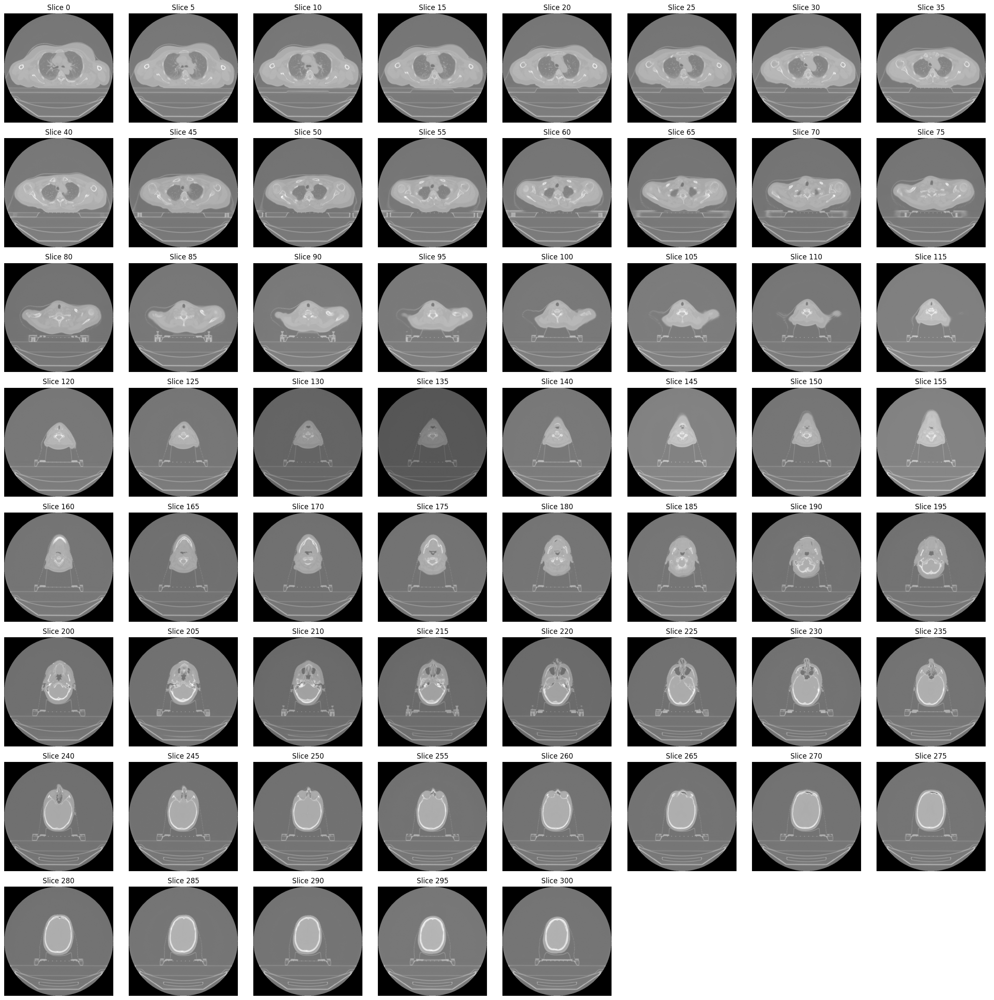

In [17]:
print('Original Spacing:', example_image.GetSpacing())
resampled_image = resample(example_image, [1, 1, 1])
print('Resampled Spacing:', resampled_image.GetSpacing())

visualize_3d_slices_adaptive(resampled_image, axis=0, step=5)

## Resize

Original Size: (512, 512, 152)
Resized Size: (256, 256, 152)


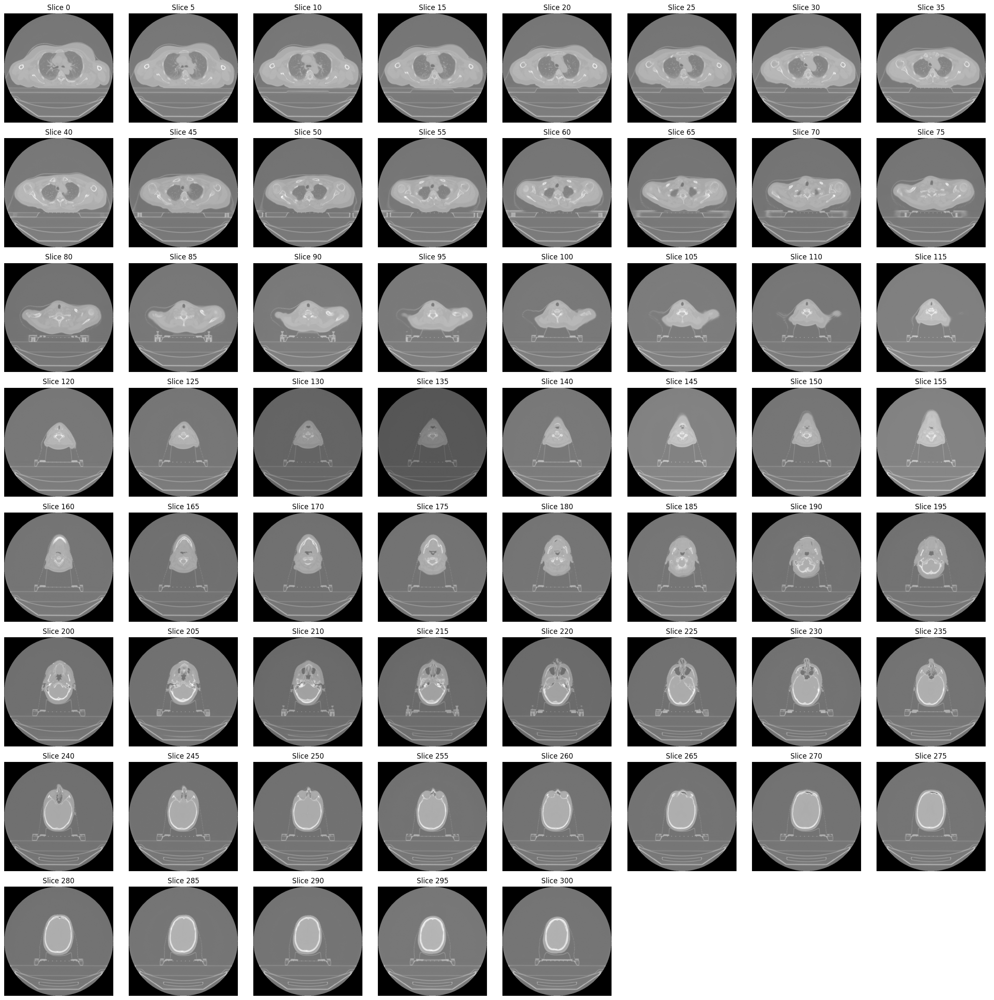

In [18]:
print('Original Size:', example_image.GetSize())
resized_image = resize(example_image, [256, 256, 0])
print('Resized Size:', resized_image.GetSize())

visualize_3d_slices_adaptive(resampled_image, axis=0, step=5)

## Zoom

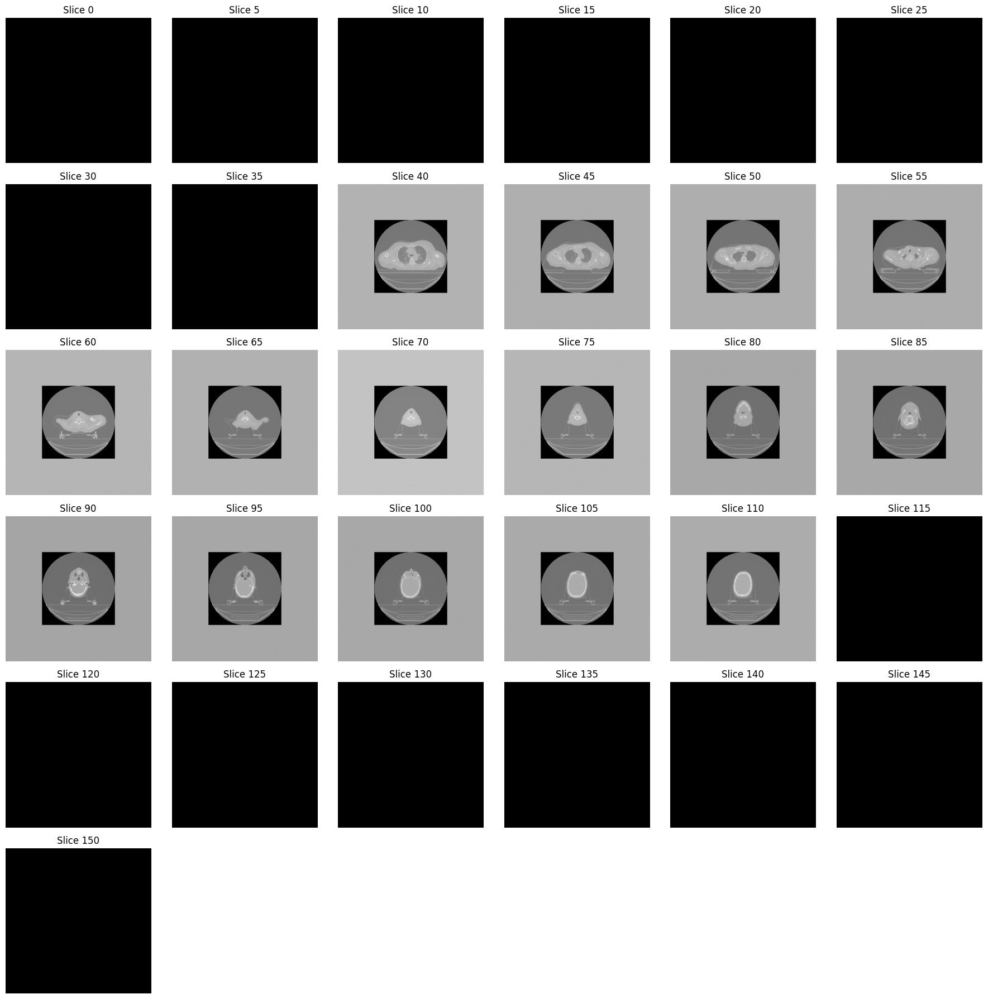

In [8]:
zoomed_image = zoom(example_image, 2.0)

visualize_3d_slices_adaptive(zoomed_image, axis=0, step=5)

## Rotate

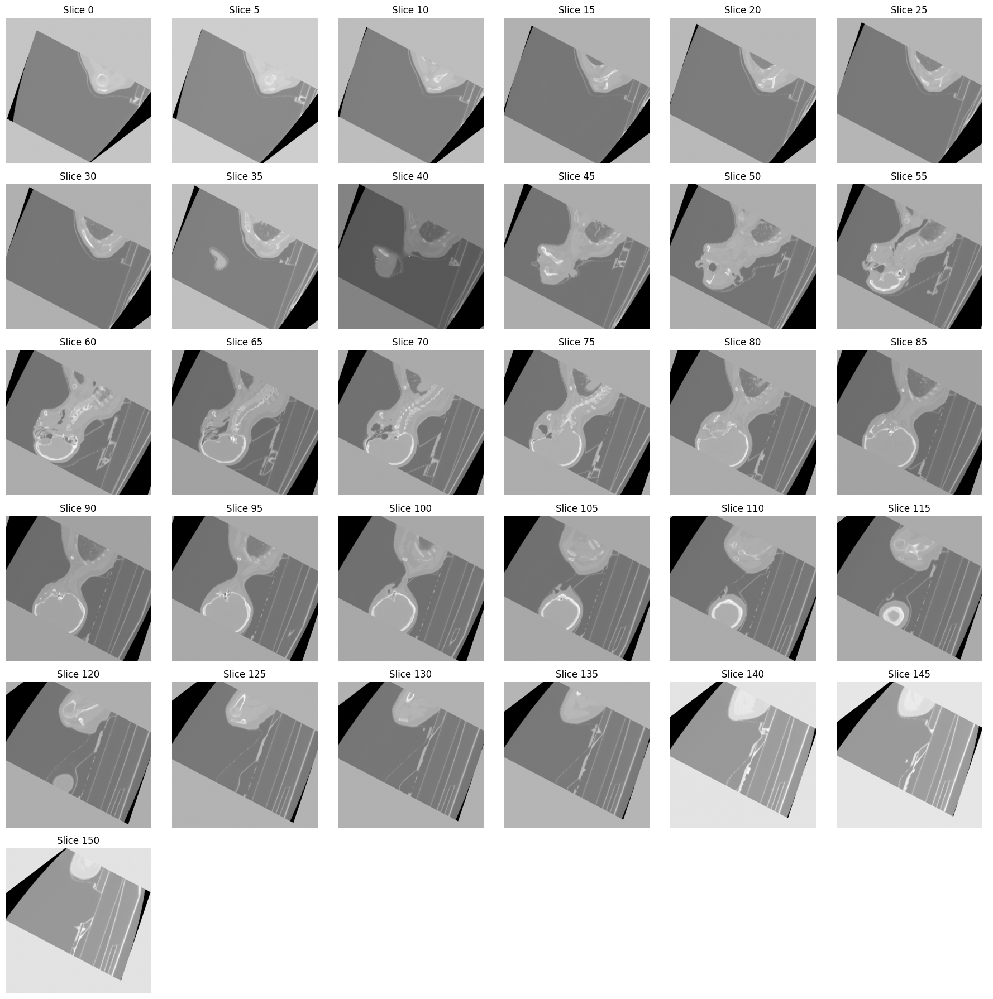

In [124]:
size = example_image.GetSize()
center_voxel = [size[i] // 2 for i in range(len(size))]

rotated_image = rotate(example_image, center_voxel, [45, 45, 45])

visualize_3d_slices_adaptive(rotated_image, axis=0, step=5)

## Crop

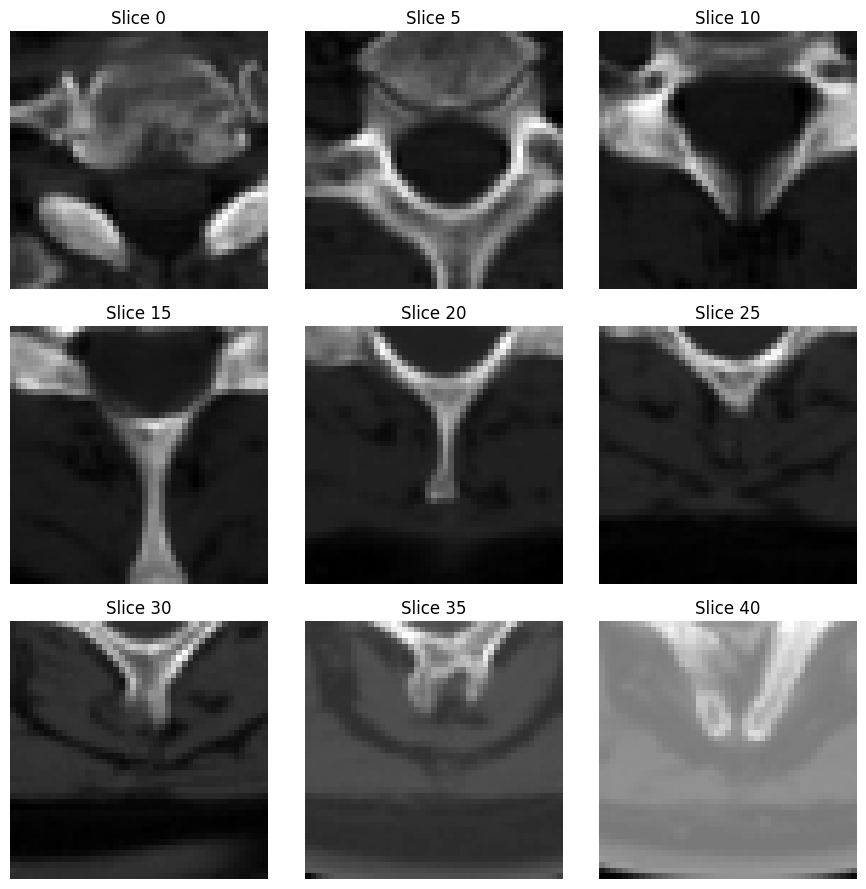

In [19]:
cropped_image = crop(example_image, [256, 256, 60], [45, 45, 45])

visualize_3d_slices_adaptive(cropped_image, axis=0, step=5)

# Mask Transformations

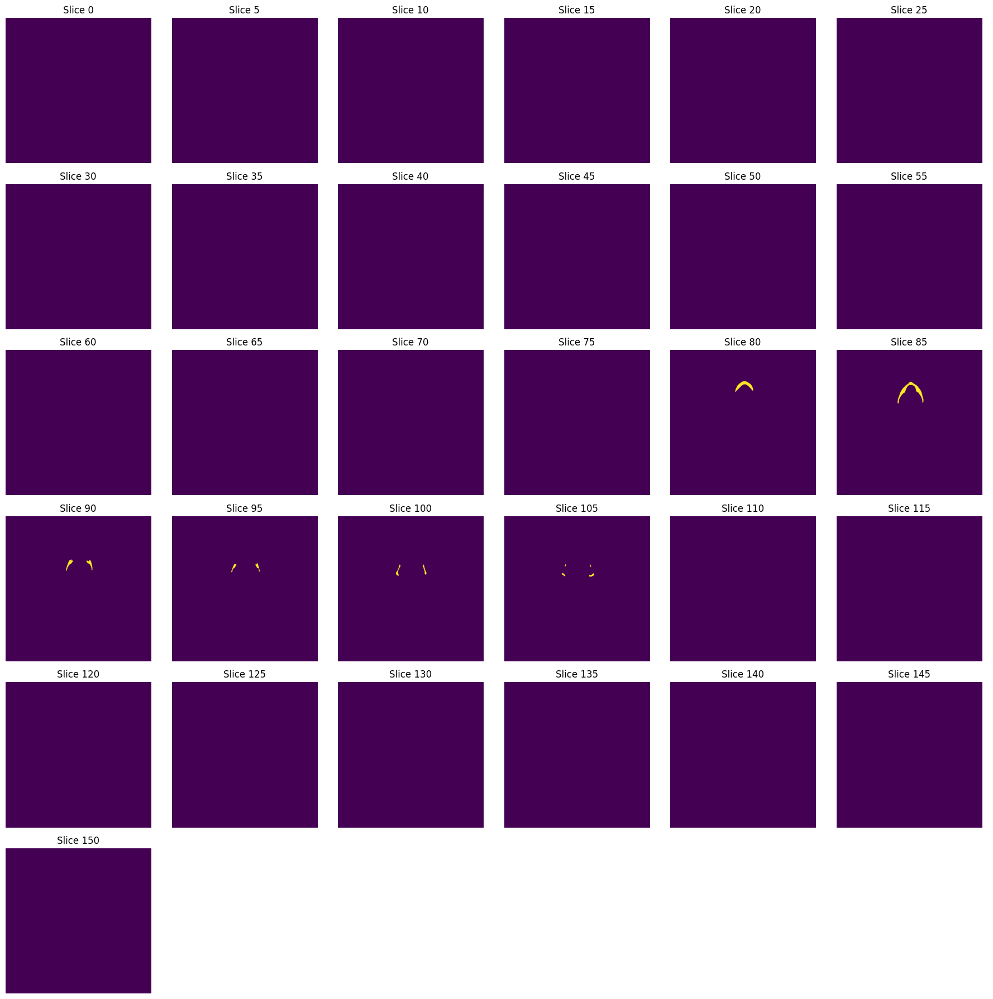

In [119]:
mask_path = '/home/joshua-siraj/Documents/BHKLAB/imgtools_test/RADCURE/RADCURE-0005/02-12-2002-NA-Research HNC Planning CT-48575/Pinnacle ROI-07053'
mask_scan = read_dicom_auto(mask_path)
mask = mask_scan.to_segmentation(example_image, roi_names={"Man":"Mandible_Bone.*"})

visualize_3d_slices_adaptive(mask, axis=0, step=5, cmap=None)

## Centroid

In [118]:
centre_coords = centroid(mask)
print(centre_coords)

(259, 155, 88)


## Bounding Box

In [112]:
box_coords = bounding_box(mask)
print(box_coords)

((201, 111, 79), (115, 103, 30))


## Crop to Bounding Box

[258.5 162.5  94. ]


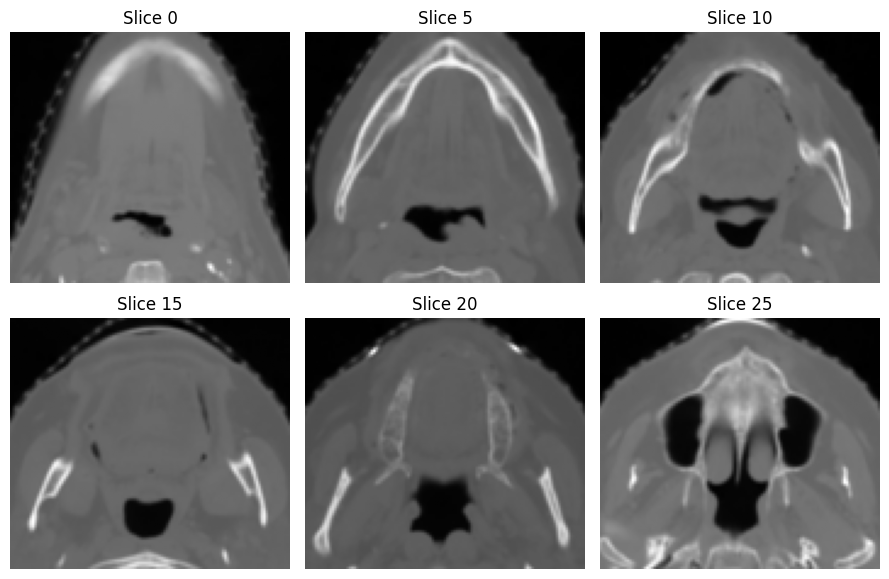

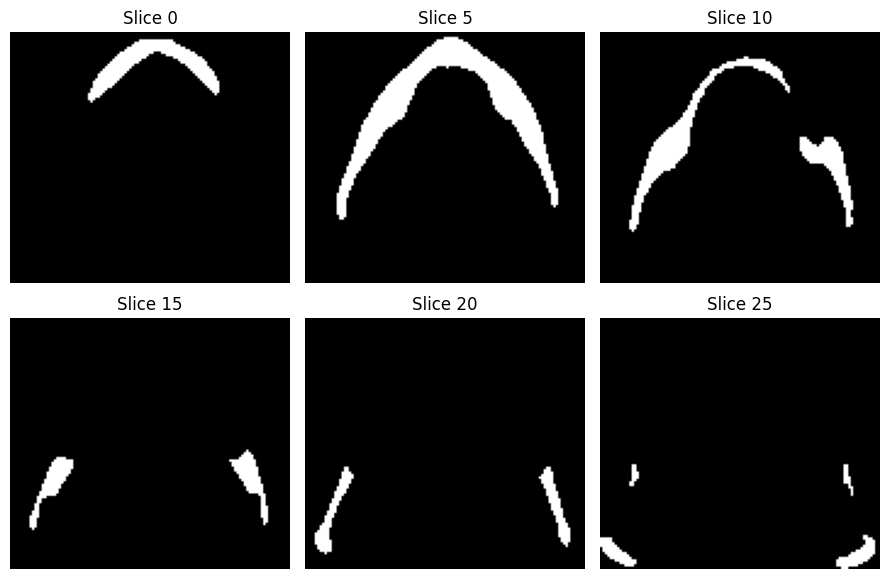

In [116]:
cropped_mask, cropped_image, crop_centre = crop_to_mask_bounding_box(example_image, mask)
print(crop_centre)

visualize_3d_slices_adaptive(cropped_mask, axis=0, step=5)
visualize_3d_slices_adaptive(cropped_image, axis=0, step=5)

# Intensity Transformations

## Clip Intensity

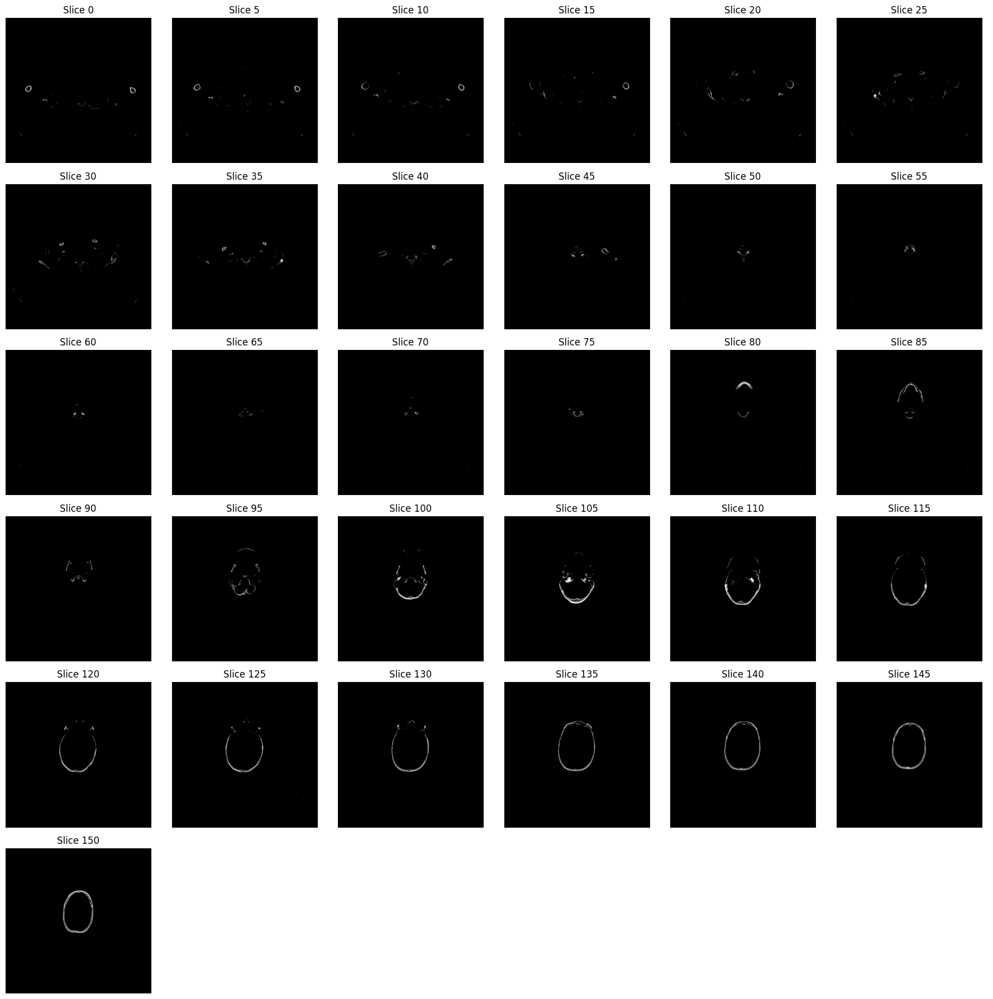

In [5]:
clipped_image = clip_intensity(example_image, 500, 1500)

visualize_3d_slices_adaptive(clipped_image, axis=0, step=5)

## Window Intensity

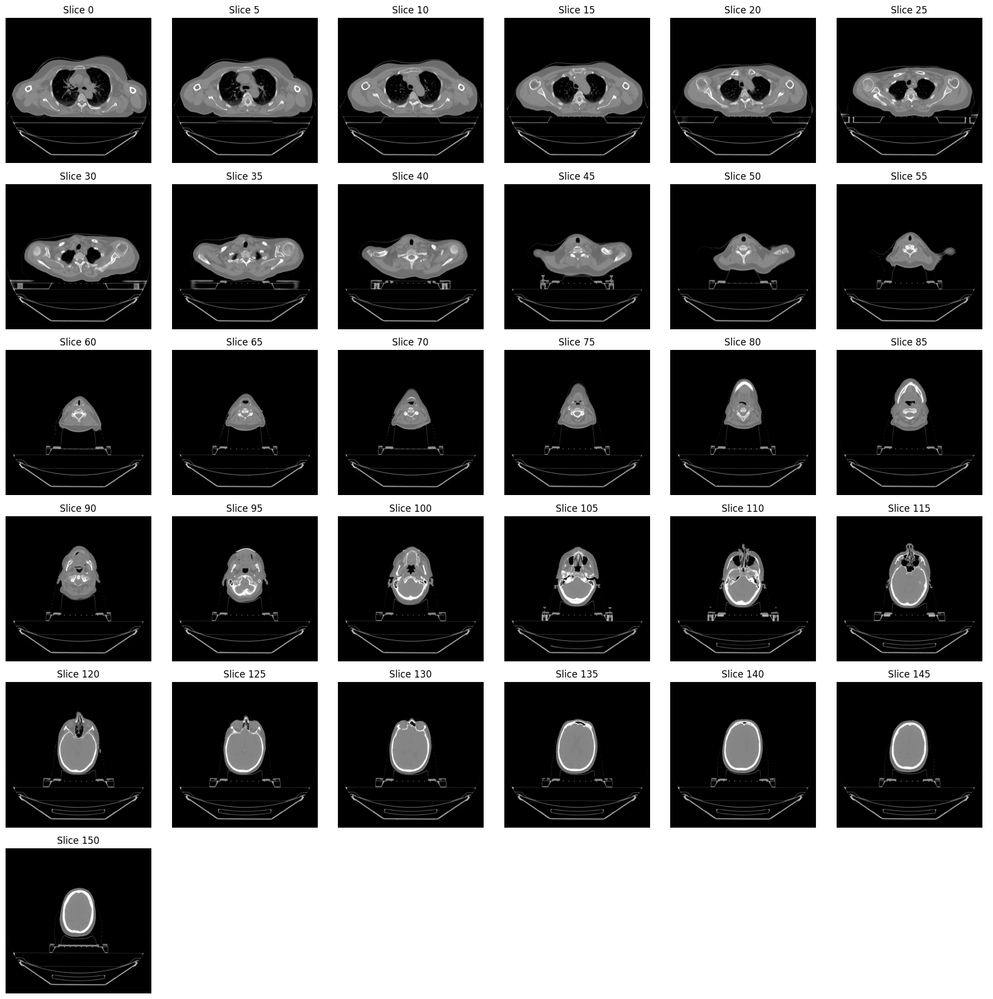

In [8]:
windowed_image = window_intensity(example_image, 1500, 0)

visualize_3d_slices_adaptive(windowed_image, axis=0, step=5)

## Min-max Normalization

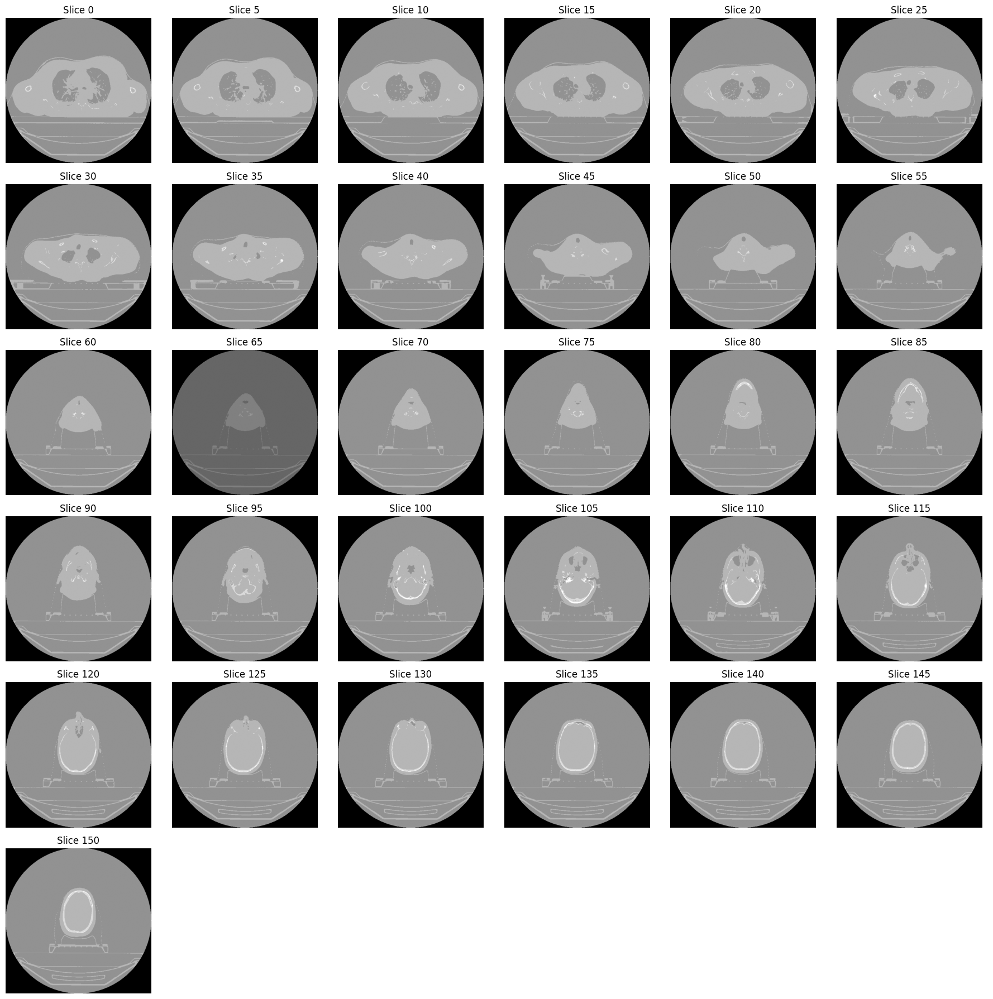

In [15]:
min_max_image = min_max_scale(example_image, minimum=-5, maximum=5)

visualize_3d_slices_adaptive(min_max_image, axis=0, step=5)

## Standardization

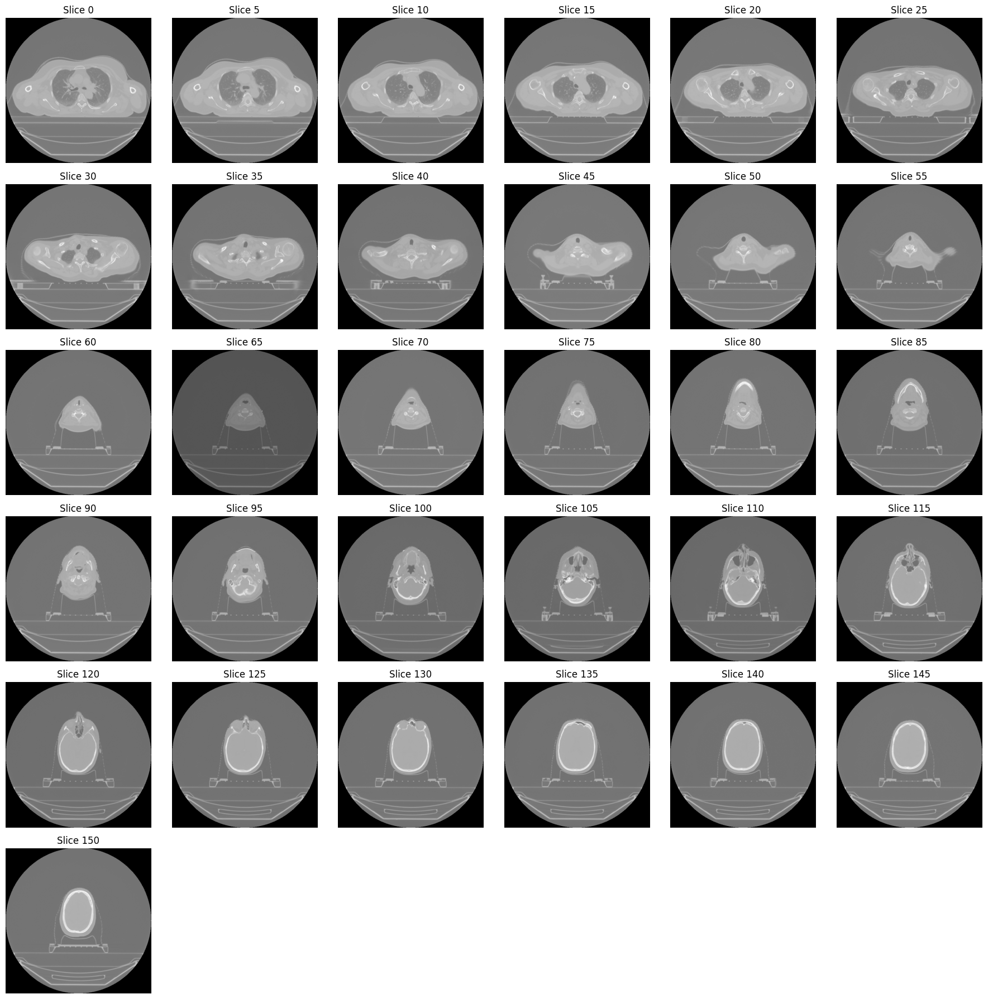

In [18]:
standardized_image = standard_scale(example_image)

visualize_3d_slices_adaptive(standardized_image, axis=0, step=5)